# PROJECT 2

## Table of contents
<a id='table_of_contents'></a>

0. [Import libraries](#import_libraries)
1. [Import data](#import_data)
2. [Data exploration](#data_exploration)
3. [Data cleaning](#data_cleaning)
4. [Data preparation](#data_preparation)
5. [Benchmark model](#Benchmark_model)
    5.1. [Train-test split](#Train-test_split)
    5.2. [Fit a model to the data](#Fit_a_model_to_the_data)
    5.3. [Model evaluation](#Model_evaluation)
7. [Feature engineering](#Feature_engineering)
8. [Model training](#Model_training)
    7.1. [Decision Tree](#Decision_tree)
    7.2. [KNN](#KNN)
    7.3. [Comparing algorithm performances](#Comparing_algorithm_performances)
9. [Tuning](#Tuning)


### 0.Import libraries  <a id='import_libraries'></a>



[Back_to_top](#table_of_contents)

In [6]:
import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import scipy
import sklearn

### 1.Import Data <a id='import_data'></a>
[Back_to_top](#table_of_contents)

In [7]:
hcc_data = pd.read_csv("hcc_dataset.csv")

In [8]:
pd.set_option('display.max_columns',None)

In [9]:
print(hcc_data.shape)
hcc_data.head()

(165, 50)


,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,Diabetes,Obesity,Hemochro,AHT,CRI,HIV,NASH,Varices,Spleno,PHT,PVT,Metastasis,Hallmark,Age,Grams_day,Packs_year,PS,Encephalopathy,Ascites,INR,AFP,Hemoglobin,MCV,Leucocytes,Platelets,Albumin,Total_Bil,ALT,AST,GGT,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class
0,Male,No,Yes,No,No,No,No,Yes,No,Yes,Yes,?,Yes,No,No,No,No,Yes,No,No,No,No,Yes,67,137,15,Active,NaN,NaN,1.53,95,13.7,106.6,4.9,99,3.4,2.1,34,41,183,150,7.1,0.7,1,3.5,0.5,?,?,?,Lives
1,Female,?,No,No,No,No,Yes,Yes,?,?,Yes,No,No,Yes,No,No,No,Yes,No,No,No,No,Yes,62,0,?,Active,NaN,NaN,?,?,?,?,?,?,?,?,?,?,?,?,?,?,1,1.8,?,?,?,?,Lives
2,Male,No,Yes,Yes,No,Yes,No,Yes,No,Yes,No,No,No,Yes,Yes,No,No,No,No,Yes,No,Yes,Yes,78,50,50,Ambulatory,NaN,Mild,0.96,5.8,8.9,79.8,8.4,472,3.3,0.4,58,68,202,109,7,2.1,5,13,0.1,28,6,16,Lives
3,Male,Yes,Yes,No,No,No,No,Yes,No,Yes,Yes,No,No,Yes,No,No,No,No,No,No,No,Yes,Yes,77,40,30,Active,NaN,NaN,0.95,2440,13.4,97.1,9,279,3.7,0.4,16,64,94,174,8.1,1.11,2,15.7,0.2,?,?,?,Dies
4,Male,Yes,Yes,Yes,No,Yes,No,Yes,No,Yes,No,No,No,Yes,Yes,No,No,No,No,No,No,No,Yes,76,100,30,Active,NaN,NaN,0.94,49,14.3,95.1,6.4,199,4.1,0.7,147,306,173,109,6.9,1.8,1,9,?,59,15,22,Lives


### 2.Data exploration  <a id='data_exploration'></a>

[Back_to_top](#table_of_contents)

In [10]:
hcc_data.columns

Index(['Gender', 'Symptoms', 'Alcohol', 'HBsAg', 'HBeAg', 'HBcAb', 'HCVAb',
       'Cirrhosis', 'Endemic', 'Smoking', 'Diabetes', 'Obesity', 'Hemochro',
       'AHT', 'CRI', 'HIV', 'NASH', 'Varices', 'Spleno', 'PHT', 'PVT',
       'Metastasis', 'Hallmark', 'Age', 'Grams_day', 'Packs_year', 'PS',
       'Encephalopathy', 'Ascites', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', 'Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin', 'Class'],
      dtype='object')

In [11]:
hcc_data.dtypes

Gender            object
Symptoms          object
Alcohol           object
HBsAg             object
HBeAg             object
HBcAb             object
HCVAb             object
Cirrhosis         object
Endemic           object
Smoking           object
Diabetes          object
Obesity           object
Hemochro          object
AHT               object
CRI               object
HIV               object
NASH              object
Varices           object
Spleno            object
PHT               object
PVT               object
Metastasis        object
Hallmark          object
Age                int64
Grams_day         object
Packs_year        object
PS                object
Encephalopathy    object
Ascites           object
INR               object
AFP               object
Hemoglobin        object
MCV               object
Leucocytes        object
Platelets         object
Albumin           object
Total_Bil         object
ALT               object
AST               object
GGT               object


In [12]:
numerical_columns = ['Age','Grams_day', 'Packs_year','INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', 'Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin']
for col in numerical_columns:
    # Verificar se a coluna é de tipo object, indicando possível presença de strings
    if hcc_data[col].dtype == 'object' :
        hcc_data[col]=pd.to_numeric(hcc_data[col].str.replace(' ', ''), errors='coerce')
    else:
        # Se não for object, converte diretamente
        hcc_data[col]=pd.to_numeric(hcc_data[col], errors='coerce')

In [13]:
hcc_data.dtypes

Gender             object
Symptoms           object
Alcohol            object
HBsAg              object
HBeAg              object
HBcAb              object
HCVAb              object
Cirrhosis          object
Endemic            object
Smoking            object
Diabetes           object
Obesity            object
Hemochro           object
AHT                object
CRI                object
HIV                object
NASH               object
Varices            object
Spleno             object
PHT                object
PVT                object
Metastasis         object
Hallmark           object
Age                 int64
Grams_day         float64
Packs_year        float64
PS                 object
Encephalopathy     object
Ascites            object
INR               float64
AFP               float64
Hemoglobin        float64
MCV               float64
Leucocytes        float64
Platelets         float64
Albumin           float64
Total_Bil         float64
ALT               float64
AST         

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Grams_day'}>,
        <Axes: title={'center': 'Packs_year'}>,
        <Axes: title={'center': 'INR'}>, <Axes: title={'center': 'AFP'}>],
       [<Axes: title={'center': 'Hemoglobin'}>,
        <Axes: title={'center': 'MCV'}>,
        <Axes: title={'center': 'Leucocytes'}>,
        <Axes: title={'center': 'Platelets'}>,
        <Axes: title={'center': 'Albumin'}>],
       [<Axes: title={'center': 'Total_Bil'}>,
        <Axes: title={'center': 'ALT'}>, <Axes: title={'center': 'AST'}>,
        <Axes: title={'center': 'GGT'}>, <Axes: title={'center': 'ALP'}>],
       [<Axes: title={'center': 'TP'}>,
        <Axes: title={'center': 'Creatinine'}>,
        <Axes: title={'center': 'Nodules'}>,
        <Axes: title={'center': 'Major_Dim'}>,
        <Axes: title={'center': 'Dir_Bil'}>],
       [<Axes: title={'center': 'Iron'}>,
        <Axes: title={'center': 'Sat'}>,
        <Axes: title={'center': 'Ferritin'}>, <Axes: >

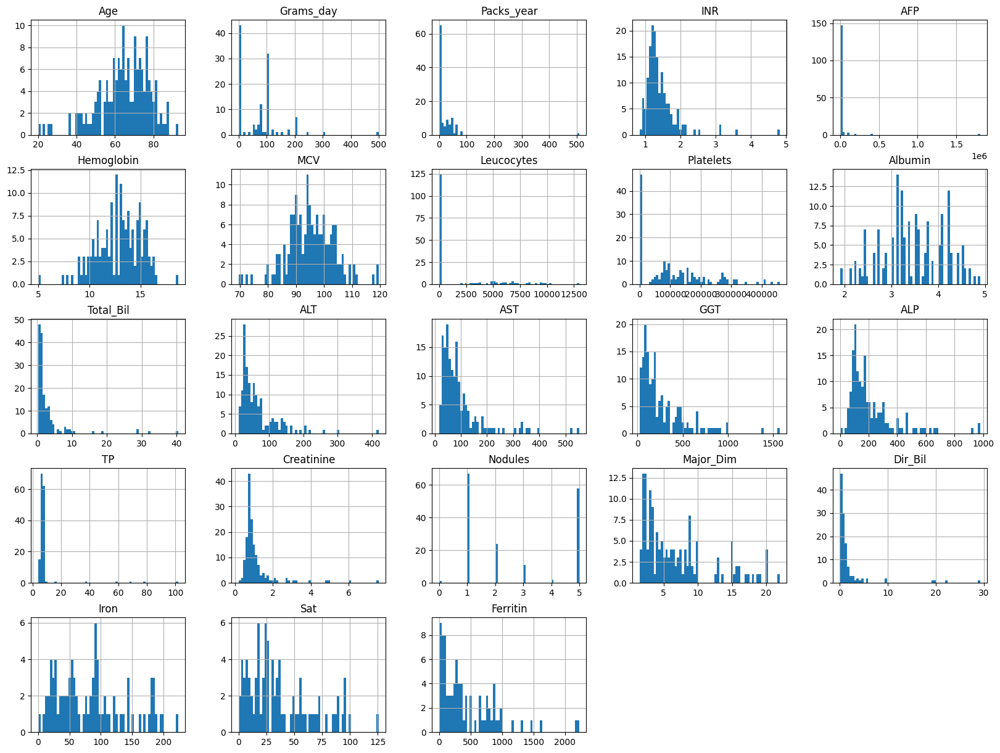

In [14]:
hcc_data.hist(figsize=(20,15),bins=60)

<Axes: xlabel='index', ylabel='Grams_day'>

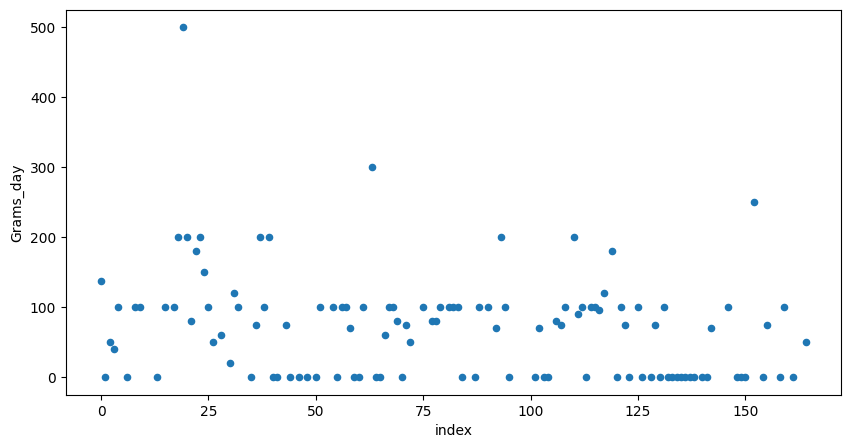

In [15]:
hcc_data.reset_index().plot(kind='scatter',y='Grams_day',x='index',figsize=(10,5))

<Axes: xlabel='Grams_day'>

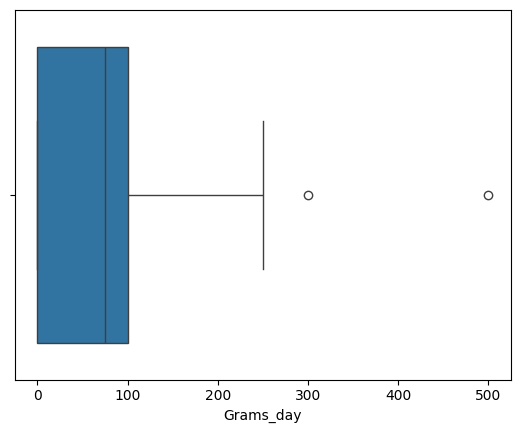

In [16]:
sns.boxplot(x=hcc_data['Grams_day'])

<Axes: xlabel='index', ylabel='Packs_year'>

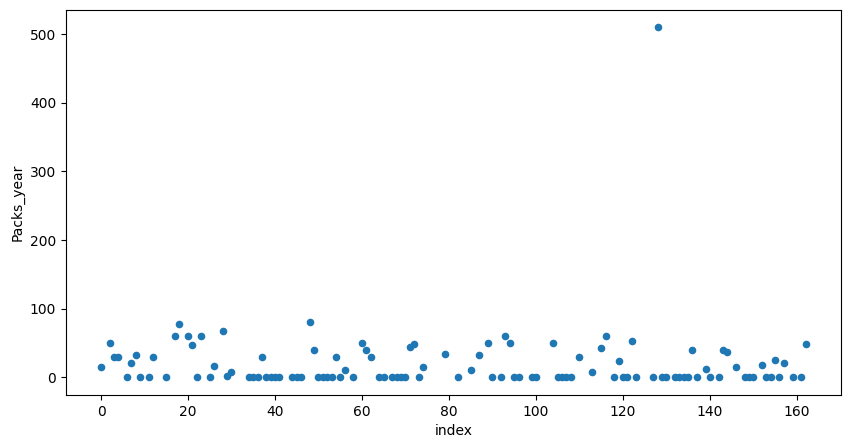

In [17]:
hcc_data.reset_index().plot(kind='scatter',y='Packs_year',x='index',figsize=(10,5))

In [18]:
hcc_data[hcc_data['Packs_year']>100].shape

(1, 50)

<Axes: xlabel='index', ylabel='INR'>

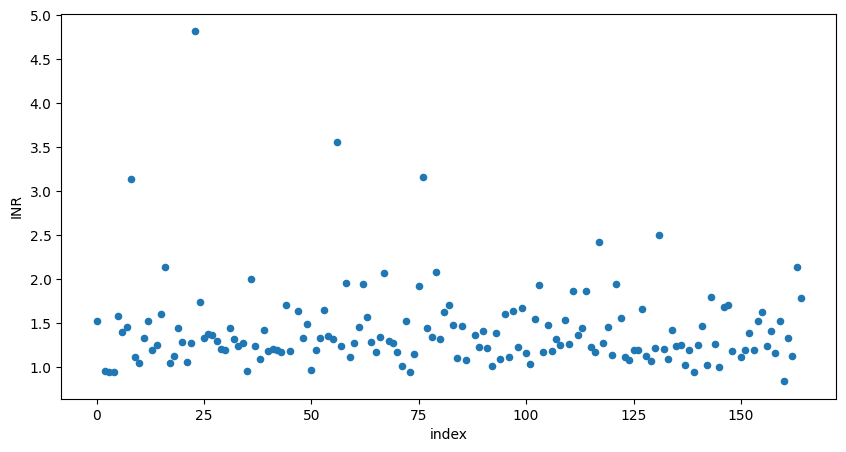

In [19]:
hcc_data.reset_index().plot(kind='scatter',y='INR',x='index',figsize=(10,5))

In [20]:
hcc_data[hcc_data['Packs_year']>2.5].shape

(49, 50)

<Axes: xlabel='index', ylabel='AFP'>

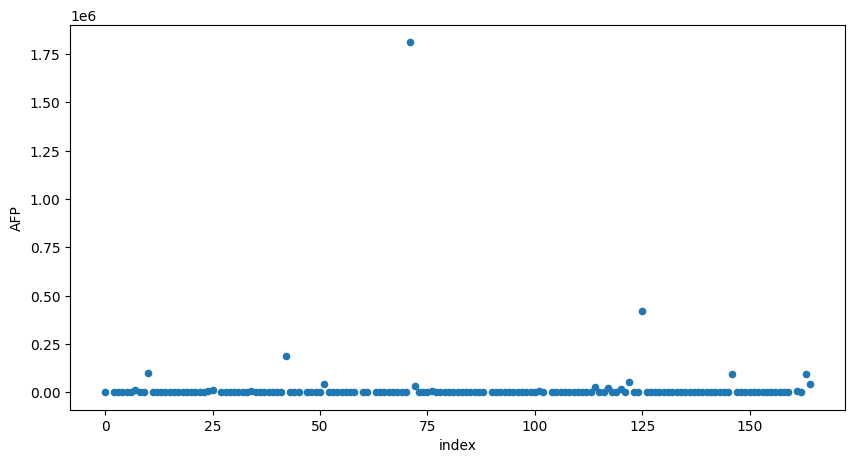

In [21]:
hcc_data.reset_index().plot(kind='scatter',y='AFP',x='index',figsize=(10,5))

In [22]:
hcc_data[hcc_data['Packs_year']>500].shape

(1, 50)

<Axes: xlabel='index', ylabel='Hemoglobin'>

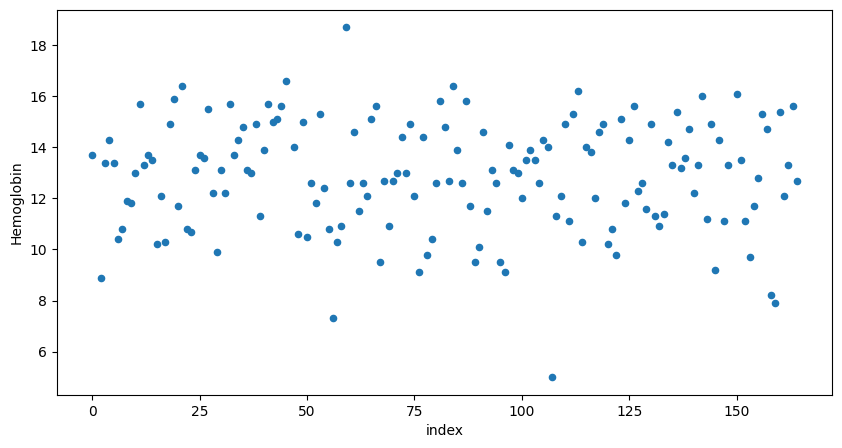

In [23]:
hcc_data.reset_index().plot(kind='scatter',y='Hemoglobin',x='index',figsize=(10,5))

In [24]:
hcc_data['Hemoglobin'].mean()

12.87901234567901

In [25]:
hcc_data[hcc_data['Hemoglobin']<10].shape

(15, 50)

In [26]:
hcc_data[hcc_data['Hemoglobin']>17.2].shape

(1, 50)

<Axes: xlabel='index', ylabel='MCV'>

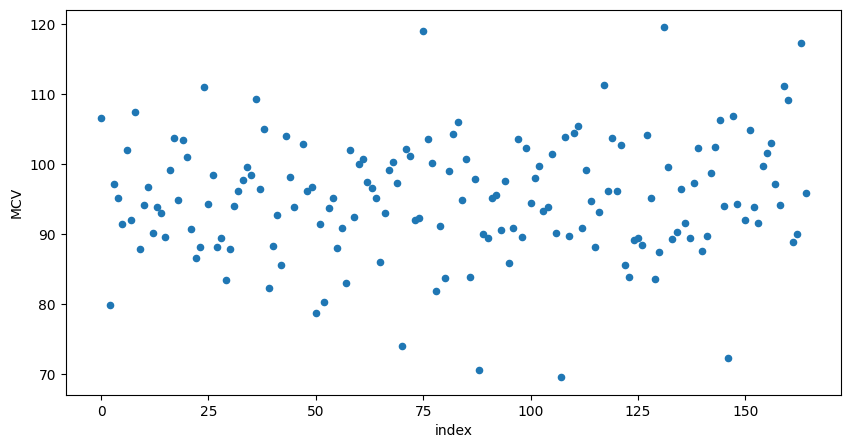

In [27]:
hcc_data.reset_index().plot(kind='scatter',y='MCV',x='index',figsize=(10,5))

In [28]:
hcc_data[hcc_data['MCV']>111].shape

(5, 50)

In [29]:
hcc_data[hcc_data['MCV']<71].shape

(2, 50)

<Axes: xlabel='index', ylabel='Leucocytes'>

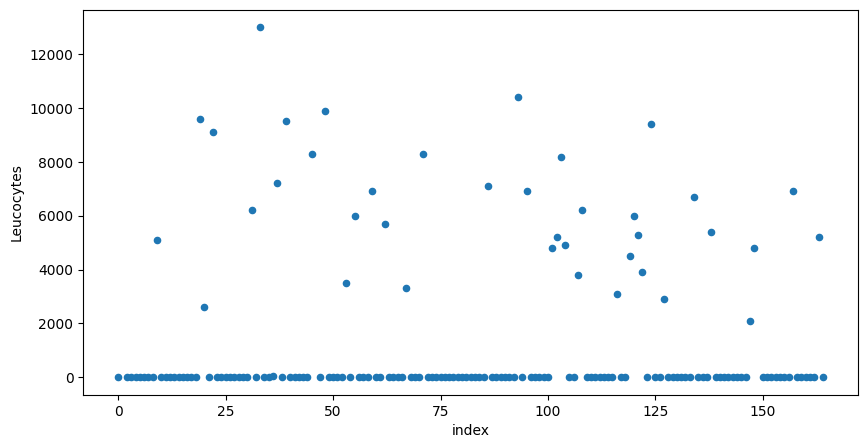

In [30]:
hcc_data.reset_index().plot(kind='scatter',y='Leucocytes',x='index',figsize=(10,5))

In [31]:
hcc_data[hcc_data['Leucocytes']>11000].shape

(1, 50)

In [32]:
hcc_data['Leucocytes'].describe()

count      162.000000
mean      1473.961549
std       2909.106006
min          2.200000
25%          5.100000
50%          7.200000
75%         19.525000
max      13000.000000
Name: Leucocytes, dtype: float64

In [33]:
hcc_data[hcc_data['Leucocytes']<200].shape

(124, 50)

<Axes: xlabel='index', ylabel='Platelets'>

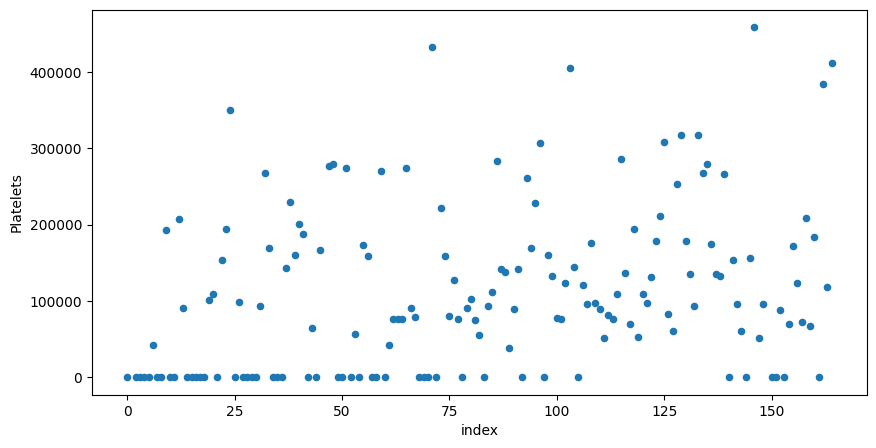

In [34]:
hcc_data.reset_index().plot(kind='scatter',y='Platelets',x='index',figsize=(10,5))

In [35]:
hcc_data['Platelets'].describe()

count       162.000000
mean     113206.442654
std      107118.632481
min           1.710000
25%         255.750000
50%       93000.000000
75%      171500.000000
max      459000.000000
Name: Platelets, dtype: float64

In [36]:
hcc_data[hcc_data['Platelets']<50000].shape

(50, 50)

<Axes: xlabel='index', ylabel='Albumin'>

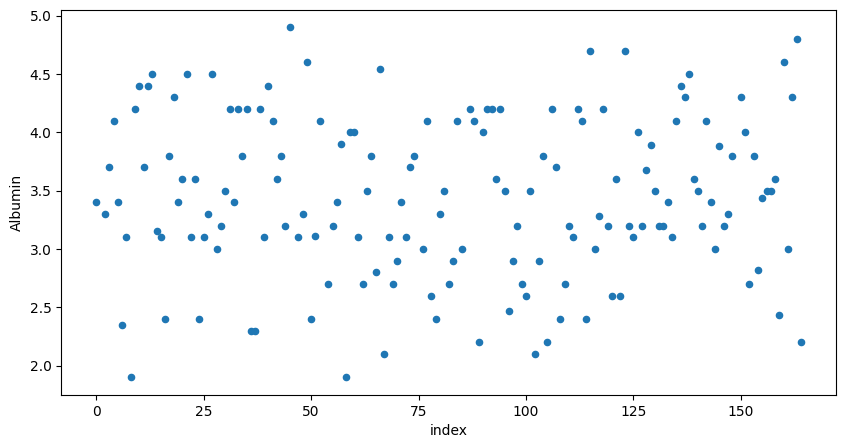

In [37]:
hcc_data.reset_index().plot(kind='scatter',y='Albumin',x='index',figsize=(10,5))

In [38]:
hcc_data[hcc_data['Albumin']<2.0].shape

(2, 50)

<Axes: xlabel='index', ylabel='Total_Bil'>

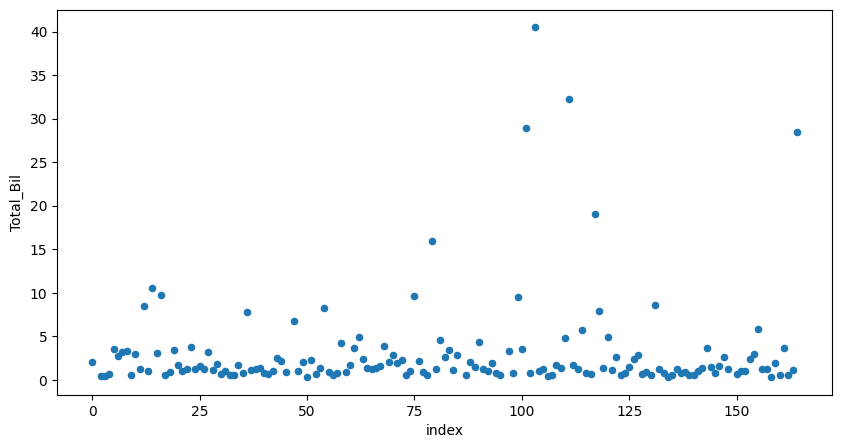

In [39]:
hcc_data.reset_index().plot(kind='scatter',y='Total_Bil',x='index',figsize=(10,5))

In [40]:
hcc_data[hcc_data['Total_Bil']>20].shape

(4, 50)

<Axes: xlabel='index', ylabel='ALT'>

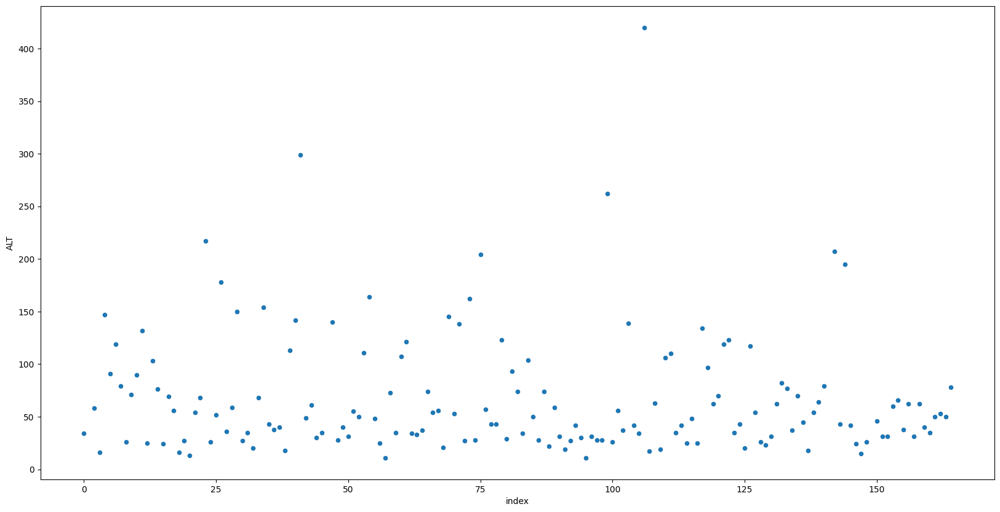

In [41]:
hcc_data.reset_index().plot(kind='scatter',y='ALT',x='index',figsize=(20,10))

In [42]:
hcc_data['ALT'].describe()

count    161.000000
mean      67.093168
std       57.539747
min       11.000000
25%       31.000000
50%       50.000000
75%       78.000000
max      420.000000
Name: ALT, dtype: float64

In [43]:
hcc_data[hcc_data['ALT']>300].shape

(1, 50)

<Axes: xlabel='index', ylabel='AST'>

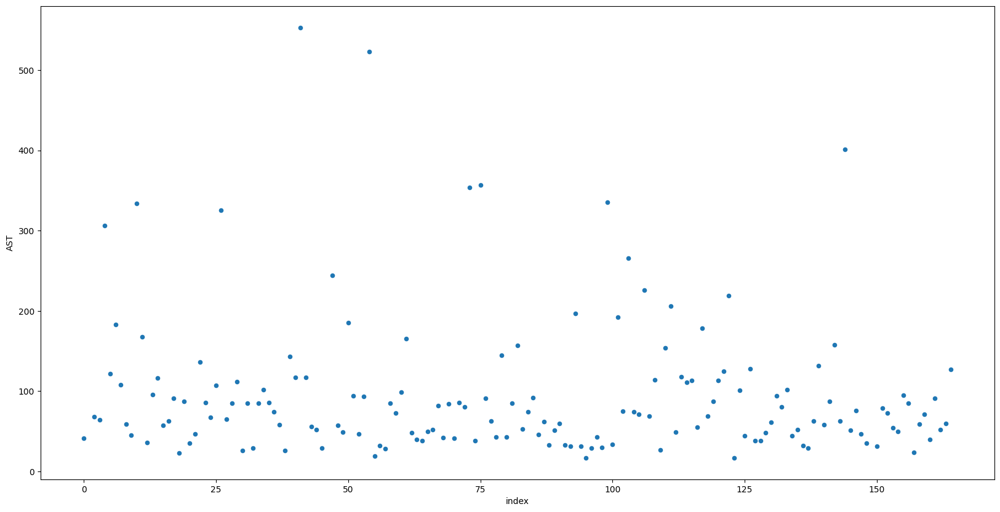

In [44]:
hcc_data.reset_index().plot(kind='scatter',y='AST',x='index',figsize=(20,10))

In [45]:
hcc_data['AST'].describe()

count    162.000000
mean      96.382716
std       87.484241
min       17.000000
25%       46.250000
50%       71.000000
75%      110.250000
max      553.000000
Name: AST, dtype: float64

In [46]:
hcc_data[hcc_data['AST']>400].shape

(3, 50)

In [47]:
hcc_data[hcc_data['AST']<25].shape

(5, 50)

<Axes: xlabel='index', ylabel='GGT'>

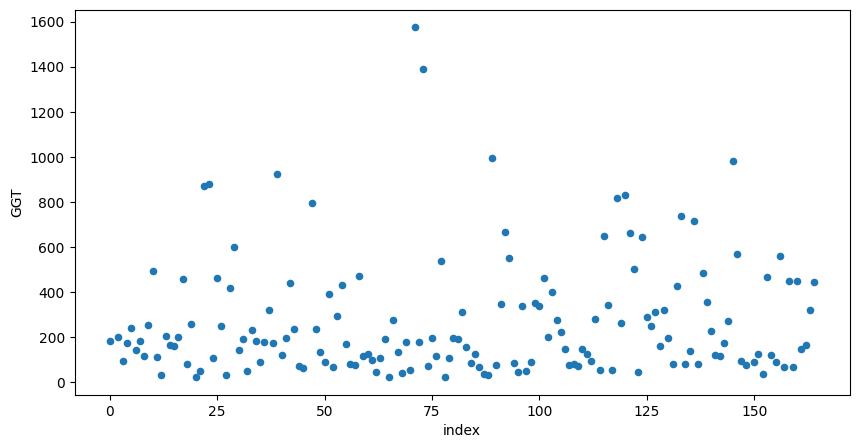

In [48]:
hcc_data.reset_index().plot(kind='scatter',y='GGT',x='index',figsize=(10,5))

In [49]:
hcc_data['GGT'].describe()

count     162.000000
mean      268.026543
std       258.750319
min        23.000000
25%        91.250000
50%       179.500000
75%       345.250000
max      1575.000000
Name: GGT, dtype: float64

In [50]:
hcc_data[hcc_data['GGT']>=1000].shape

(2, 50)

<Axes: xlabel='index', ylabel='ALP'>

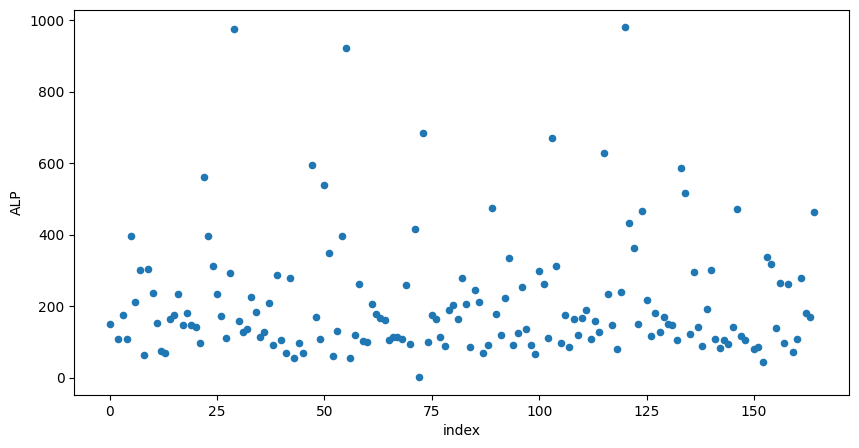

In [51]:
hcc_data.reset_index().plot(kind='scatter',y='ALP',x='index',figsize=(10,5))

In [52]:
hcc_data['ALP'].describe()

count    162.000000
mean     212.211605
std      167.943548
min        1.280000
25%      108.250000
50%      162.000000
75%      261.500000
max      980.000000
Name: ALP, dtype: float64

In [53]:
hcc_data[hcc_data['ALP']<30].shape

(1, 50)

In [54]:
hcc_data[hcc_data['ALP']>800].shape

(3, 50)

<Axes: xlabel='index', ylabel='Creatinine'>

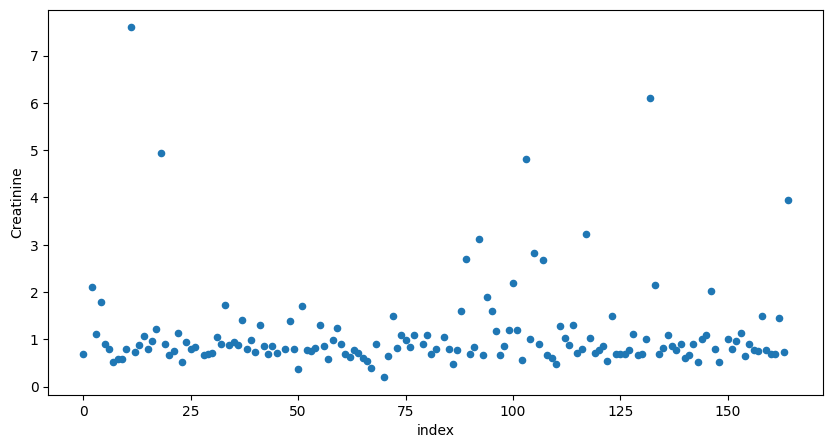

In [55]:
hcc_data.reset_index().plot(kind='scatter',y='Creatinine',x='index',figsize=(10,5))

In [56]:
hcc_data['Creatinine'].describe()

count    158.000000
mean       1.127089
std        0.955856
min        0.200000
25%        0.700000
50%        0.850000
75%        1.100000
max        7.600000
Name: Creatinine, dtype: float64

In [57]:
hcc_data[hcc_data['Creatinine']>4].shape

(4, 50)

<Axes: xlabel='index', ylabel='TP'>

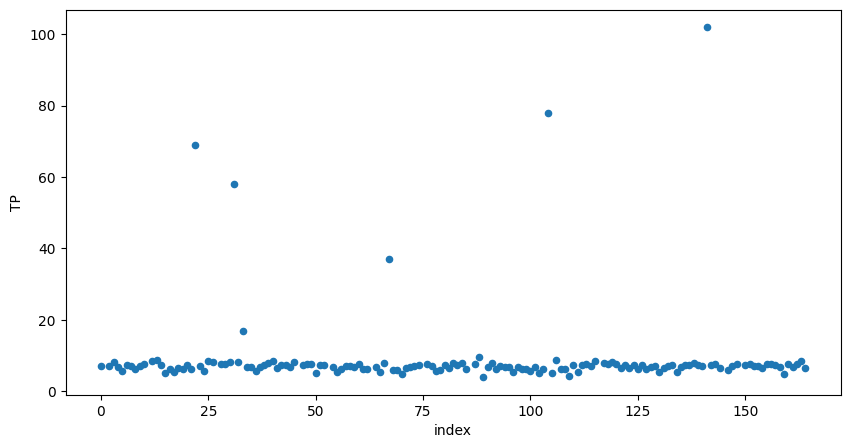

In [58]:
hcc_data.reset_index().plot(kind='scatter',y='TP',x='index',figsize=(10,5))

In [59]:
hcc_data['TP'].describe()

count    154.000000
mean       8.961039
std       11.728739
min        3.900000
25%        6.300000
50%        7.050000
75%        7.575000
max      102.000000
Name: TP, dtype: float64

In [60]:
hcc_data[hcc_data['TP']>11].shape

(6, 50)

<Axes: xlabel='index', ylabel='Major_Dim'>

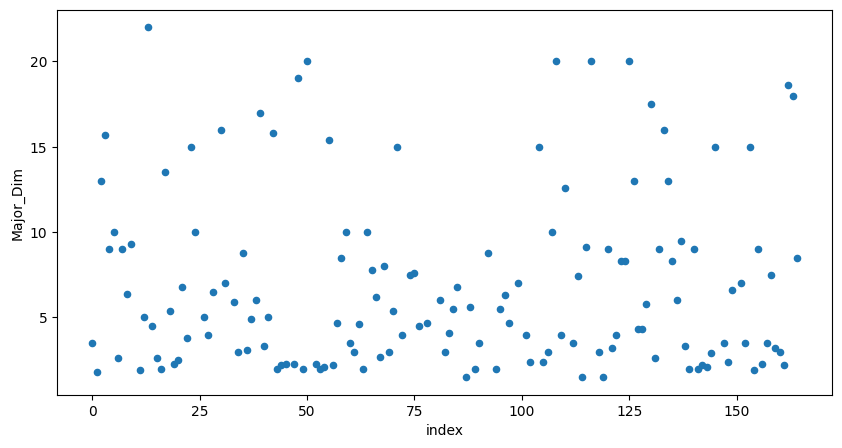

In [61]:
hcc_data.reset_index().plot(kind='scatter',y='Major_Dim',x='index',figsize=(10,5))

In [62]:
hcc_data[hcc_data['Major_Dim']>20].shape

(1, 50)

<Axes: xlabel='index', ylabel='Dir_Bil'>

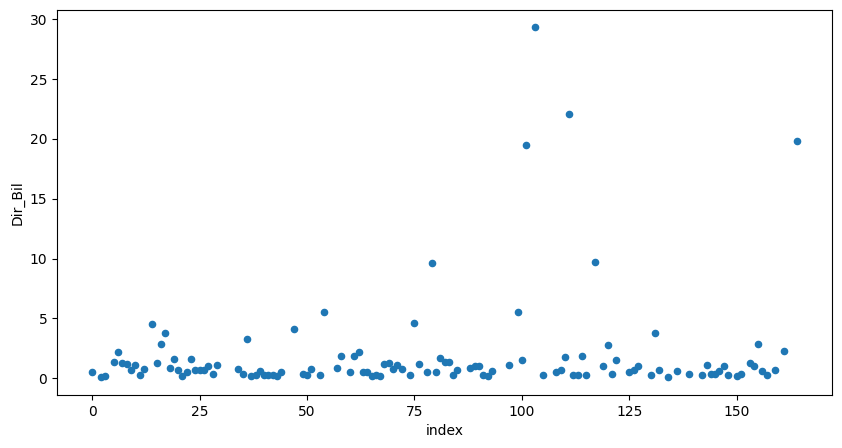

In [63]:
hcc_data.reset_index().plot(kind='scatter',y='Dir_Bil',x='index',figsize=(10,5))

In [64]:
hcc_data[hcc_data['Dir_Bil']>7].shape

(6, 50)

<Axes: xlabel='index', ylabel='Iron'>

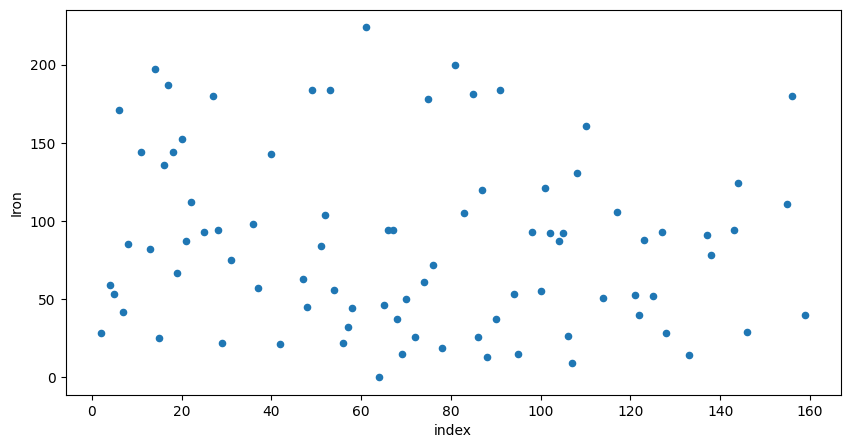

In [65]:
hcc_data.reset_index().plot(kind='scatter',y='Iron',x='index',figsize=(10,5))

In [66]:
hcc_data[hcc_data['Iron']<10].shape

(2, 50)

In [67]:
hcc_data[hcc_data['Iron']>200].shape

(1, 50)

<Axes: xlabel='index', ylabel='Sat'>

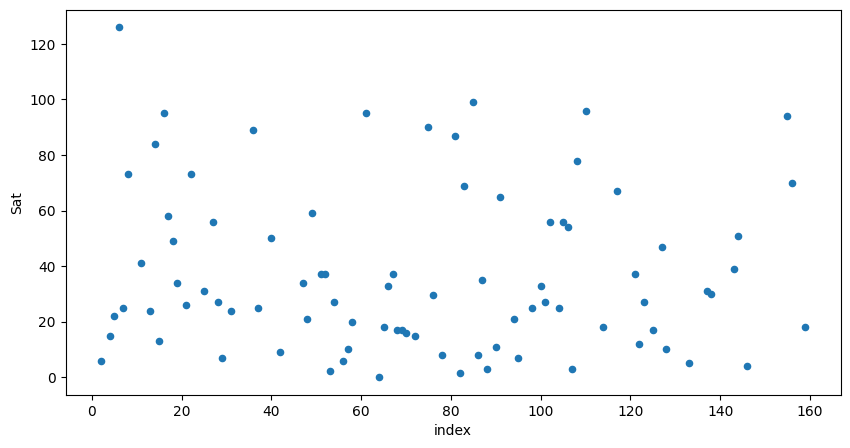

In [68]:
hcc_data.reset_index().plot(kind='scatter',y='Sat',x='index',figsize=(10,5))

In [69]:
hcc_data[hcc_data['Sat']>90].shape

(6, 50)

<Axes: xlabel='index', ylabel='Ferritin'>

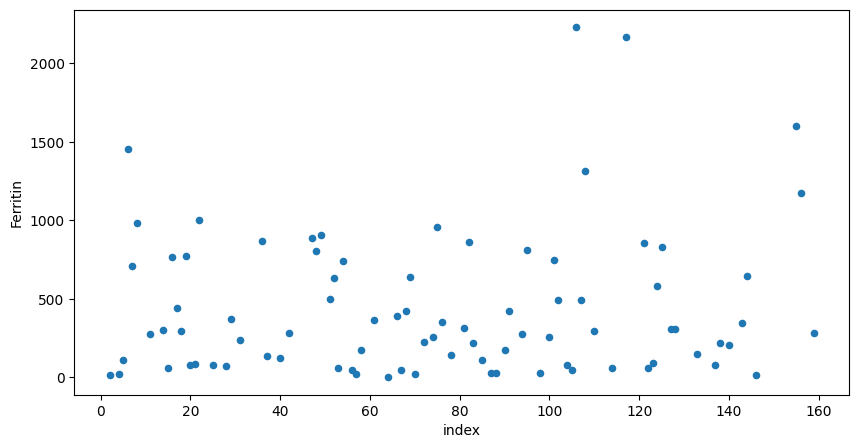

In [70]:
hcc_data.reset_index().plot(kind='scatter',y='Ferritin',x='index',figsize=(10,5))

In [71]:
hcc_data['Ferritin'].describe()

count      85.000000
mean      438.997647
std       457.114454
min         0.000000
25%        84.000000
50%       295.000000
75%       706.000000
max      2230.000000
Name: Ferritin, dtype: float64

In [72]:
hcc_data[hcc_data['Ferritin']>1000].shape

(7, 50)

### 3.Data cleaning  <a id='data_cleaning'></a>

[Back_to_top](#table_of_contents)

In [73]:
median_value = hcc_data[hcc_data['Grams_day'] <300]['Grams_day'].median()
hcc_data.loc[hcc_data['Grams_day'] >= 300, 'Grams_day'] = median_value

In [74]:
median_value = hcc_data[hcc_data['Packs_year'] < 100]['Packs_year'].median()
hcc_data.loc[hcc_data['Packs_year'] >= 100, 'Packs_year'] = median_value

In [75]:
median_value = hcc_data[hcc_data['INR'] < 2.5]['INR'].median()
hcc_data.loc[hcc_data['INR'] >= 2.5, 'INR'] = median_value

In [76]:
median_value = hcc_data[hcc_data['AFP'] < 125000]['AFP'].median()
hcc_data.loc[hcc_data['AFP'] >= 125000, 'AFP'] = median_value

<Axes: >

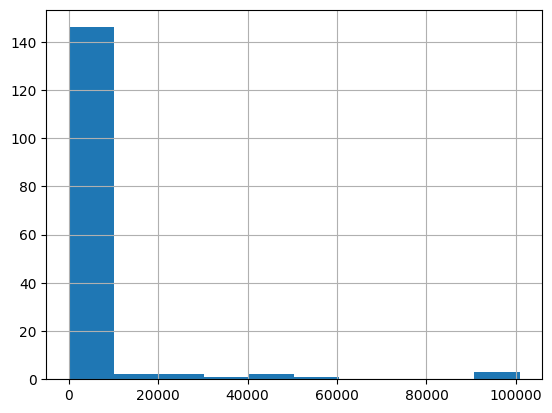

In [77]:
hcc_data['AFP'].hist()

In [78]:
median_value = hcc_data[hcc_data['Hemoglobin'] > 6]['Hemoglobin'].median()
hcc_data.loc[hcc_data['Hemoglobin'] <= 6, 'Hemoglobin'] = median_value

In [79]:
median_value = hcc_data[(hcc_data['MCV'] > 71) & (hcc_data['MCV'] < 111)]['MCV'].median()
hcc_data.loc[(hcc_data['MCV'] <= 71 )|(hcc_data['MCV'] >=111 ), 'MCV'] = median_value

In [80]:
median_value = hcc_data[hcc_data['Total_Bil'] < 20]['Total_Bil'].median()
hcc_data.loc[hcc_data['Total_Bil'] >= 20, 'Total_Bil'] = median_value

In [81]:
median_value = hcc_data[hcc_data['AST'] < 500]['AST'].median()
hcc_data.loc[hcc_data['AST'] >= 500, 'AST'] = median_value

In [82]:
median_value = hcc_data[hcc_data['GGT'] < 1000]['GGT'].median()
hcc_data.loc[hcc_data['GGT'] >= 1000, 'GGT'] = median_value

In [83]:
median_value = hcc_data[(hcc_data['ALP'] > 30) & (hcc_data['ALP'] < 800)]['ALP'].median()
hcc_data.loc[(hcc_data['ALP'] <= 30 )|(hcc_data['ALP'] >=800 ), 'ALP'] = median_value

In [84]:
median_value = hcc_data[hcc_data['Creatinine'] < 4]['Creatinine'].median()
hcc_data.loc[hcc_data['Creatinine'] >= 4, 'Creatinine'] = median_value

In [85]:
median_value = hcc_data[hcc_data['TP'] < 20]['TP'].median()
hcc_data.loc[hcc_data['TP'] >= 20, 'TP'] = median_value

In [86]:
median_value = hcc_data[hcc_data['Major_Dim'] < 20]['Major_Dim'].median()
hcc_data.loc[hcc_data['Major_Dim'] >= 20, 'Major_Dim'] = median_value

In [87]:
median_value = hcc_data[hcc_data['Dir_Bil'] < 18]['Dir_Bil'].median()
hcc_data.loc[hcc_data['Dir_Bil'] >= 18, 'Dir_Bil'] = median_value

In [88]:
median_value = hcc_data[(hcc_data['Iron'] > 10) & (hcc_data['Iron'] < 200)]['Iron'].median()
hcc_data.loc[(hcc_data['Iron'] <= 10 )|(hcc_data['Iron'] >=200 ), 'Iron'] = median_value

In [89]:
median_value = hcc_data[(hcc_data['Ferritin'] > 10) & (hcc_data['Ferritin'] < 1250)]['Ferritin'].median()
hcc_data.loc[(hcc_data['Ferritin'] <= 10 )|(hcc_data['Ferritin'] >=1250 ), 'Ferritin'] = median_value

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Grams_day'}>,
        <Axes: title={'center': 'Packs_year'}>,
        <Axes: title={'center': 'INR'}>, <Axes: title={'center': 'AFP'}>],
       [<Axes: title={'center': 'Hemoglobin'}>,
        <Axes: title={'center': 'MCV'}>,
        <Axes: title={'center': 'Leucocytes'}>,
        <Axes: title={'center': 'Platelets'}>,
        <Axes: title={'center': 'Albumin'}>],
       [<Axes: title={'center': 'Total_Bil'}>,
        <Axes: title={'center': 'ALT'}>, <Axes: title={'center': 'AST'}>,
        <Axes: title={'center': 'GGT'}>, <Axes: title={'center': 'ALP'}>],
       [<Axes: title={'center': 'TP'}>,
        <Axes: title={'center': 'Creatinine'}>,
        <Axes: title={'center': 'Nodules'}>,
        <Axes: title={'center': 'Major_Dim'}>,
        <Axes: title={'center': 'Dir_Bil'}>],
       [<Axes: title={'center': 'Iron'}>,
        <Axes: title={'center': 'Sat'}>,
        <Axes: title={'center': 'Ferritin'}>, <Axes: >

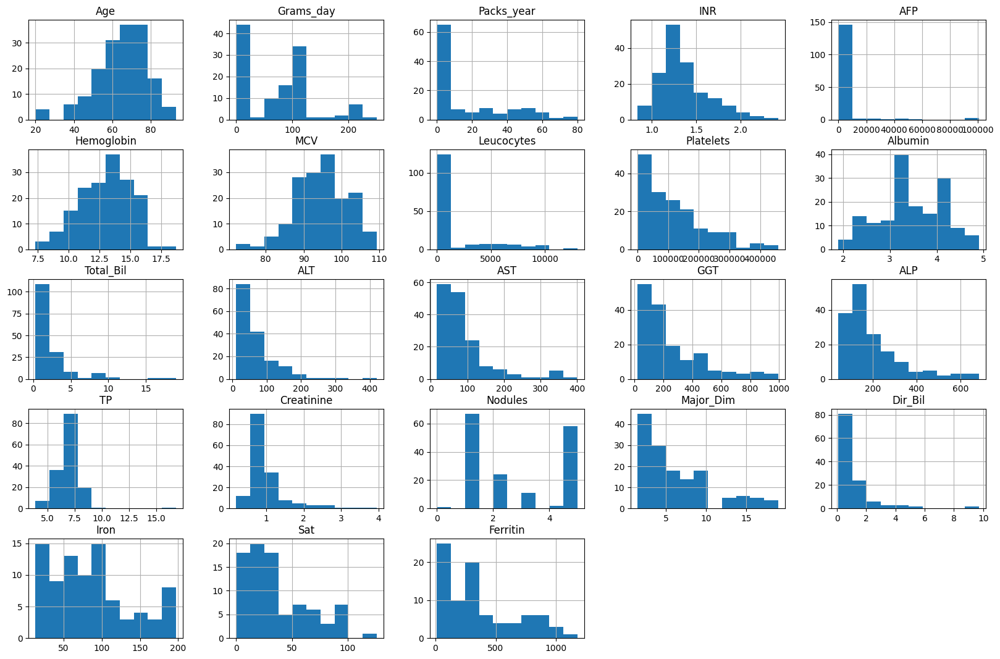

In [90]:
hcc_data.hist(figsize=(20,13))

In [91]:
hcc_data.replace('?', np.nan, inplace=True)

In [92]:
mask = ((hcc_data['Class'] == 'Lives') | (hcc_data['Class'] == 'Dies'))
hcc_data.loc[mask,'Encephalopathy'] = hcc_data.loc[mask,'Encephalopathy'].fillna('Absent')
hcc_data.loc[mask,'Ascites'] = hcc_data.loc[mask,'Ascites'].fillna('Absent')

In [93]:
hcc_data.isna().sum()

Gender             0
Symptoms          18
Alcohol            0
HBsAg             17
HBeAg             39
HBcAb             24
HCVAb              9
Cirrhosis          0
Endemic           39
Smoking           41
Diabetes           3
Obesity           10
Hemochro          23
AHT                3
CRI                2
HIV               14
NASH              22
Varices           52
Spleno            15
PHT               11
PVT                3
Metastasis         4
Hallmark           2
Age                0
Grams_day         48
Packs_year        53
PS                 0
Encephalopathy     0
Ascites            0
INR                4
AFP                8
Hemoglobin         3
MCV                3
Leucocytes         3
Platelets          3
Albumin            6
Total_Bil          5
ALT                4
AST                3
GGT                3
ALP                3
TP                11
Creatinine         7
Nodules            2
Major_Dim         20
Dir_Bil           44
Iron              79
Sat          

In [94]:
def impute_missing_data(data):
    for column in data.columns:
        if data[column].dtype == 'object':  # Para dados categóricos
            # Preencher com a moda
            mode_value = data[column].mode()[0]
            data[column].fillna(mode_value,inplace=True)
        else:  # Para dados numéricos
            # Preencher com a mediana
            median_value = data[column].median()
            data[column].fillna(median_value,inplace=True)

# Aplicar a função ao dataset
impute_missing_data(hcc_data)


C:\Users\catar\AppData\Local\Temp\ipykernel_2540\992650362.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[column].fillna(mode_value,inplace=True)
C:\Users\catar\AppData\Local\Temp\ipykernel_2540\992650362.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, w

In [95]:
hcc_data.isna().sum()

Gender            0
Symptoms          0
Alcohol           0
HBsAg             0
HBeAg             0
HBcAb             0
HCVAb             0
Cirrhosis         0
Endemic           0
Smoking           0
Diabetes          0
Obesity           0
Hemochro          0
AHT               0
CRI               0
HIV               0
NASH              0
Varices           0
Spleno            0
PHT               0
PVT               0
Metastasis        0
Hallmark          0
Age               0
Grams_day         0
Packs_year        0
PS                0
Encephalopathy    0
Ascites           0
INR               0
AFP               0
Hemoglobin        0
MCV               0
Leucocytes        0
Platelets         0
Albumin           0
Total_Bil         0
ALT               0
AST               0
GGT               0
ALP               0
TP                0
Creatinine        0
Nodules           0
Major_Dim         0
Dir_Bil           0
Iron              0
Sat               0
Ferritin          0
Class             0


### 4.Data preparation <a id='data_preparation'></a>

[Back_to_top](#table_of_contents)

### 5. Benchmark model <a id='Benchmark_model'></a>

[Back_to_top](#table_of_contents)

In [228]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

In [289]:
data_models = hcc_data.copy()
data_models

,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,Diabetes,Obesity,Hemochro,AHT,CRI,HIV,NASH,Varices,Spleno,PHT,PVT,Metastasis,Hallmark,Age,Grams_day,Packs_year,PS,Encephalopathy,Ascites,INR,AFP,Hemoglobin,MCV,Leucocytes,Platelets,Albumin,Total_Bil,ALT,AST,GGT,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class
0,Male,No,Yes,No,No,No,No,Yes,No,Yes,Yes,No,Yes,No,No,No,No,Yes,No,No,No,No,Yes,67,137.0,15.0,Active,Absent,Absent,1.530,95.0,13.7,106.60,4.9,99.0,3.4,2.1,34.0,41.0,183.0,150.0,7.1,0.70,1.0,3.5,0.5,83.0,27.0,279.0,Lives
1,Female,Yes,No,No,No,No,Yes,Yes,No,Yes,Yes,No,No,Yes,No,No,No,Yes,No,No,No,No,Yes,62,0.0,0.0,Active,Absent,Absent,1.285,30.5,13.1,94.75,7.2,93000.0,3.4,1.3,50.0,70.0,178.0,159.5,7.0,0.83,1.0,1.8,0.7,83.0,27.0,279.0,Lives
2,Male,No,Yes,Yes,No,Yes,No,Yes,No,Yes,No,No,No,Yes,Yes,No,No,No,No,Yes,No,Yes,Yes,78,50.0,50.0,Ambulatory,Absent,Mild,0.960,5.8,8.9,79.80,8.4,472.0,3.3,0.4,58.0,68.0,202.0,109.0,7.0,2.10,5.0,13.0,0.1,28.0,6.0,16.0,Lives
3,Male,Yes,Yes,No,No,No,No,Yes,No,Yes,Yes,No,No,Yes,No,No,No,No,No,No,No,Yes,Yes,77,40.0,30.0,Active,Absent,Absent,0.950,2440.0,13.4,97.10,9.0,279.0,3.7,0.4,16.0,64.0,94.0,174.0,8.1,1.11,2.0,15.7,0.2,83.0,27.0,279.0,Dies
4,Male,Yes,Yes,Yes,No,Yes,No,Yes,No,Yes,No,No,No,Yes,Yes,No,No,No,No,No,No,No,Yes,76,100.0,30.0,Active,Absent,Absent,0.940,49.0,14.3,95.10,6.4,199.0,4.1,0.7,147.0,306.0,173.0,109.0,6.9,1.80,1.0,9.0,0.7,59.0,15.0,22.0,Lives
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,Female,No,Yes,No,No,No,Yes,Yes,No,Yes,No,No,No,No,No,Yes,No,No,No,No,No,No,No,40,75.0,0.0,Active,Absent,Absent,0.840,30.5,15.4,109.20,9.3,184000.0,4.6,0.5,35.0,40.0,449.0,109.0,7.6,0.70,5.0,3.0,0.7,83.0,27.0,279.0,Lives
161,Female,Yes,No,No,No,No,No,Yes,No,No,No,No,No,Yes,No,No,No,Yes,Yes,Yes,No,No,Yes,68,0.0,0.0,Ambulatory,Absent,Absent,1.330,4887.0,12.1,88.90,2.5,141.0,3.0,3.6,50.0,91.0,147.0,280.0,6.7,0.70,1.0,2.2,2.3,83.0,27.0,279.0,Dies
162,Male,No,Yes,No,No,No,No,Yes,No,Yes,Yes,Yes,No,Yes,Yes,No,No,Yes,Yes,Yes,No,No,Yes,65,75.0,48.0,Active,Absent,Absent,1.130,75.0,13.3,90.00,8.0,385000.0,4.3,0.6,53.0,52.0,164.0,181.0,7.5,1.46,5.0,18.6,0.7,83.0,27.0,279.0,Lives
163,Male,No,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,No,No,No,No,No,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,44,75.0,0.0,Ambulatory,Absent,Absent,2.140,94964.0,15.6,94.75,5200.0,118000.0,4.8,1.1,50.0,60.0,320.0,170.0,8.4,0.74,5.0,18.0,0.7,83.0,27.0,279.0,Dies


In [290]:
X = data_models.drop(columns='Class') #features
y = data_models['Class'] #target

In [291]:
# One-hot encode
X = pd.get_dummies(X, drop_first=True)

In [292]:
data_models['Class'].unique()

array(['Lives', 'Dies'], dtype=object)

In [293]:
# Limpar valores na coluna 'Class'
data_models['Class'] = data_models['Class'].str.strip()
data_models['Class'] = data_models['Class'].str.title()

In [294]:
data_models['Class'] = data_models['Class'].map({'Lives':1, 'Dies':0})

In [295]:
data_models['Class']

0      1
1      1
2      1
3      0
4      1
      ..
160    1
161    0
162    1
163    0
164    0
Name: Class, Length: 165, dtype: int64

In [236]:
#Dividir os dados em conjuntos de treinamento e teste (aqui usamos test 20% e treinamento 80%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [237]:
# Padronize os dados
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [277]:
# Modelo de Decision Tree
dt = DecisionTreeClassifier(random_state=42)

# Parametrização
param_grid_dt = {
    'max_depth': [2, 3, 5, 7, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Grid Search
grid_search_dt = GridSearchCV(estimator=dt, param_grid=param_grid_dt, cv=5, scoring='accuracy')
grid_search_dt.fit(X_train, y_train)

# Melhor Modelo
best_dt = grid_search_dt.best_estimator_
y_pred_dt = best_dt.predict(X_test)


Decision Tree Classification Report:
               precision    recall  f1-score   support

        Dies       0.50      0.54      0.52        13
       Lives       0.68      0.65      0.67        20

    accuracy                           0.61        33
   macro avg       0.59      0.59      0.59        33
weighted avg       0.61      0.61      0.61        33



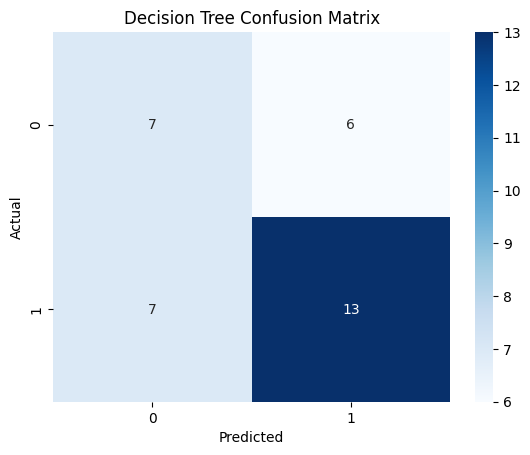

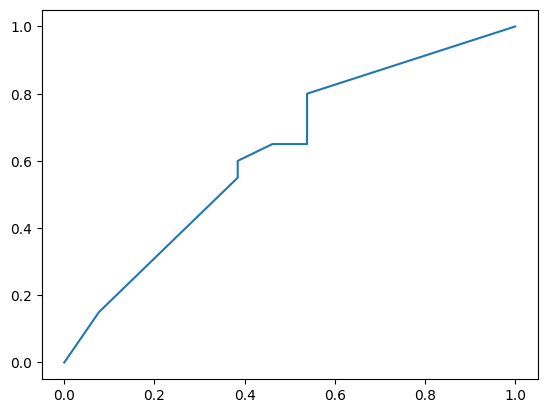

In [278]:
# Relatório de Classificação
print("Decision Tree Classification Report:\n", classification_report(y_test, y_pred_dt))

# Matriz de Confusão
cm_dt = confusion_matrix(y_test, y_pred_dt)
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues')
plt.title('Decision Tree Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# ROC Curve
y_prob_dt = best_dt.predict_proba(X_test)[:, 1]
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_prob_dt, pos_label='Lives')
roc_auc_dt = roc_auc_score(y_test, y_prob_dt)
plt.plot(fpr_dt, tpr_dt, label=f'DT (AUC = {roc_auc_dt:.2f})')


KNN Classification Report:
               precision    recall  f1-score   support

        Dies       0.60      0.23      0.33        13
       Lives       0.64      0.90      0.75        20

    accuracy                           0.64        33
   macro avg       0.62      0.57      0.54        33
weighted avg       0.63      0.64      0.59        33



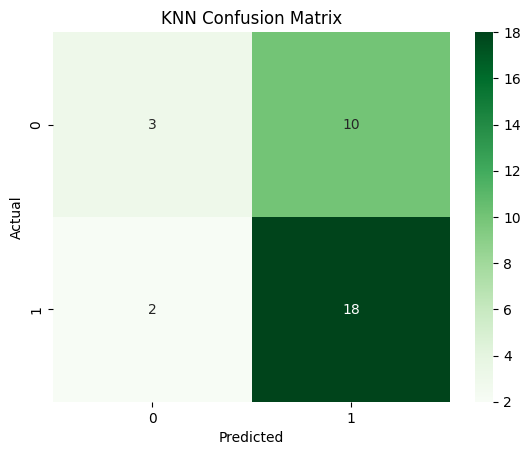

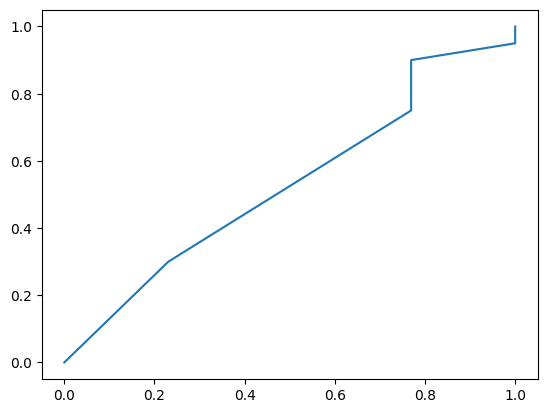

In [271]:
# Relatório de Classificação
print("KNN Classification Report:\n", classification_report(y_test, y_pred_knn))

# Matriz de Confusão
cm_knn = confusion_matrix(y_test, y_pred_knn)
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Greens')
plt.title('KNN Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# ROC Curve
y_prob_knn = best_knn.predict_proba(X_test)[:, 1]
fpr_knn, tpr_knn, _ = roc_curve(y_test, y_prob_knn, pos_label='Lives')
roc_auc_knn = roc_auc_score(y_test, y_prob_knn)
plt.plot(fpr_knn, tpr_knn, label=f'KNN (AUC = {roc_auc_knn:.2f})')


In [269]:
# Modelo KNN
knn = KNeighborsClassifier()

# Parametrização
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

# Grid Search
grid_search_knn = GridSearchCV(estimator=knn, param_grid=param_grid_knn, cv=5, scoring='accuracy')
grid_search_knn.fit(X_train, y_train)

# Melhor Modelo
best_knn = grid_search_knn.best_estimator_
y_pred_knn = best_knn.predict(X_test)

C:\Users\catar\anaconda3\envs\teste\Lib\site-packages\sklearn\model_selection\_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\catar\anaconda3\envs\teste\Lib\site-packages\sklearn\model_selection\_validation.py", line 982, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\catar\anaconda3\envs\teste\Lib\site-packages\sklearn\metrics\_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\catar\anaconda3\envs\teste\Lib\site-packages\sklearn\metrics\_scorer.py", line 345, in _score
    y_pred = method_caller(
             ^^^^^^^^^^^^^^
  File "C:\Users\catar\anaconda3\envs\teste\Lib\s

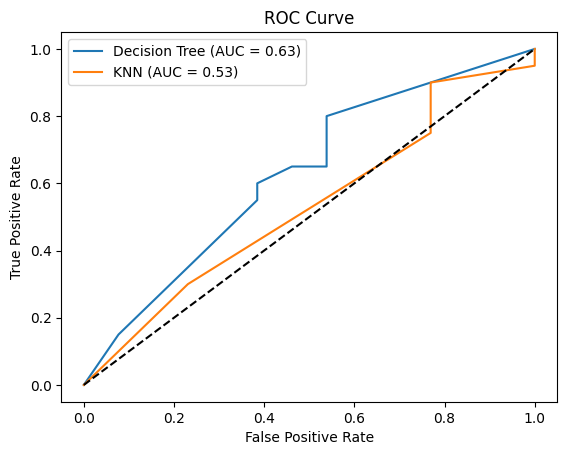

           Model  Accuracy   ROC AUC
0  Decision Tree  0.606061  0.626923
1            KNN  0.636364  0.530769


In [272]:
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (AUC = {roc_auc_dt:.2f})')
plt.plot(fpr_knn, tpr_knn, label=f'KNN (AUC = {roc_auc_knn:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='best')
plt.show()

# Tabela Comparativa de Resultados
results = {
    'Model': ['Decision Tree', 'KNN'],
    'Accuracy': [accuracy_score(y_test, y_pred_dt), accuracy_score(y_test, y_pred_knn)],
    'ROC AUC': [roc_auc_dt, roc_auc_knn]
}

results_df = pd.DataFrame(results)
print(results_df)


Best n_neighbors: 6


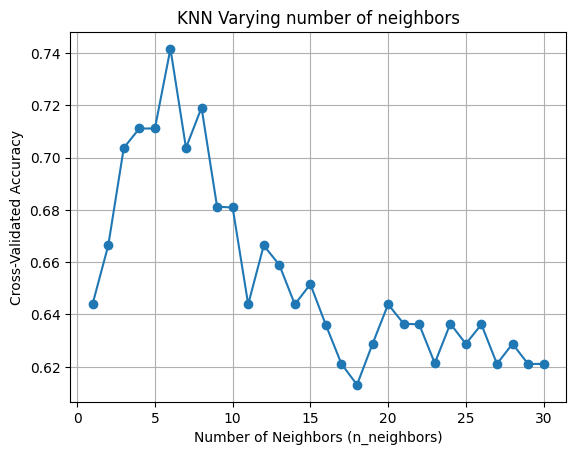

In [281]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

# Testar diferentes valores de n_neighbors
neighbors_range = range(1, 31)
cross_val_scores = []

for n_neighbors in neighbors_range:
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    # Usar validação cruzada com 5 folds
    scores = cross_val_score(knn, X_train, y_train, cv=5, scoring='accuracy')
    cross_val_scores.append(scores.mean())
# Encontrar o valor de n_neighbors com a melhor acurácia
best_n_neighbors = neighbors_range[np.argmax(cross_val_scores)]
print(f"Best n_neighbors: {best_n_neighbors}")

plt.plot(neighbors_range, cross_val_scores, marker='o')
plt.xlabel('Number of Neighbors (n_neighbors)')
plt.ylabel('Cross-Validated Accuracy')
plt.title('KNN Varying number of neighbors')
plt.grid(True)

In [279]:
# Definir os modelos e parâmetros
models = {
    'DecisionTree': {
        'model': DecisionTreeClassifier(random_state=42),
        'params': {
            'criterion': ['gini', 'entropy'],
            'max_depth': [2, 3, 5 , 7, 10, 20],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
        }
    },
    'KNN': {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [5, 6, 7, 9],
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan']
        }
    },
    'RandomForest': {
        'model': RandomForestClassifier(),
        'params': {
            'n_estimators': [50, 100, 150],
            'max_depth': [None, 4, 10, 20],
            'min_samples_split': [2, 5, 10]
        }
    },
    'GradientBoosting': {
        'model': GradientBoostingClassifier(),
        'params': {
            'n_estimators': [50, 100, 150],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 4, 5, 7]
        }
    },
    'SVM': {
        'model': SVC(probability=True),
        'params': {
            'C': [0.1, 1, 10],
            'kernel': ['linear', 'rbf', 'poly'],
            'gamma': ['scale', 'auto']
        }
    },
    'LogisticRegression': {
        'model': LogisticRegression(max_iter=1000, random_state=42),
        'params': {
            'C': [0.01, 0.1, 1, 10, 100],
            'solver': ['lbfgs', 'liblinear']
        }
    }
}


Treinando o modelo: DecisionTree
Melhores parâmetros do DecisionTree: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10}
Melhor acurácia do DecisionTree: 0.7128205128205127

Relatório de Classificação do Melhor Modelo (DecisionTree):
              precision    recall  f1-score   support

        Dies       0.50      0.54      0.52        13
       Lives       0.68      0.65      0.67        20

    accuracy                           0.61        33
   macro avg       0.59      0.59      0.59        33
weighted avg       0.61      0.61      0.61        33



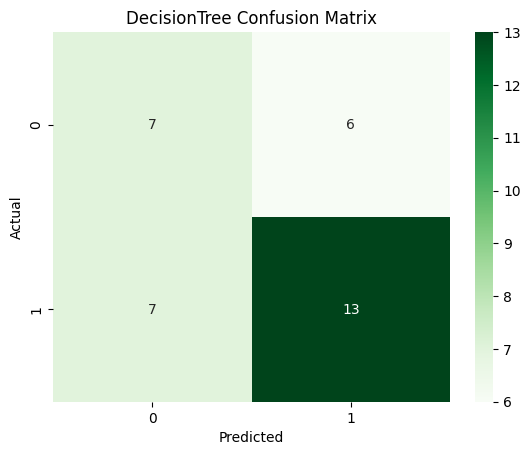

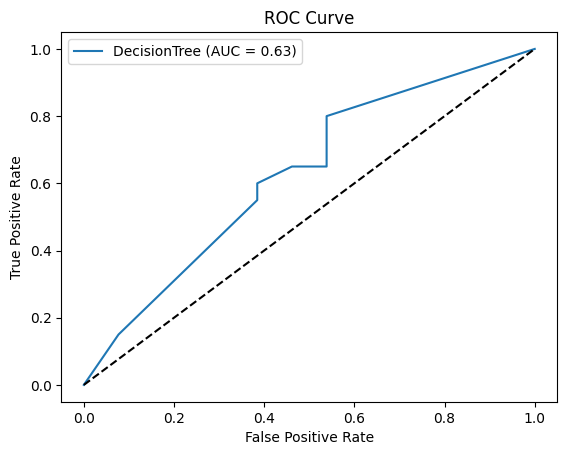

Treinando o modelo: KNN


C:\Users\catar\anaconda3\envs\teste\Lib\site-packages\sklearn\model_selection\_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\catar\anaconda3\envs\teste\Lib\site-packages\sklearn\model_selection\_validation.py", line 982, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\catar\anaconda3\envs\teste\Lib\site-packages\sklearn\metrics\_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\catar\anaconda3\envs\teste\Lib\site-packages\sklearn\metrics\_scorer.py", line 345, in _score
    y_pred = method_caller(
             ^^^^^^^^^^^^^^
  File "C:\Users\catar\anaconda3\envs\teste\Lib\s

Melhores parâmetros do KNN: {'metric': 'euclidean', 'n_neighbors': 6, 'weights': 'uniform'}
Melhor acurácia do KNN: 0.7415954415954416

Relatório de Classificação do Melhor Modelo (KNN):
              precision    recall  f1-score   support

        Dies       0.50      0.23      0.32        13
       Lives       0.63      0.85      0.72        20

    accuracy                           0.61        33
   macro avg       0.56      0.54      0.52        33
weighted avg       0.58      0.61      0.56        33



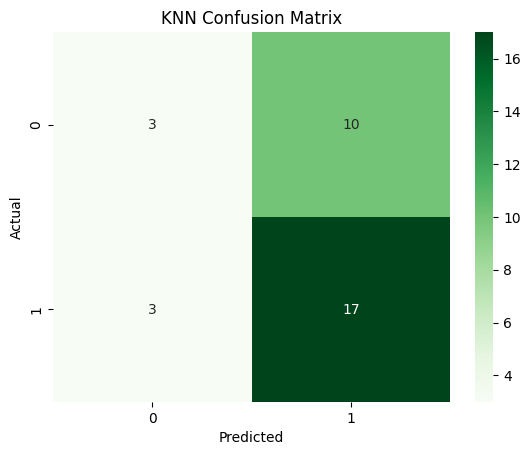

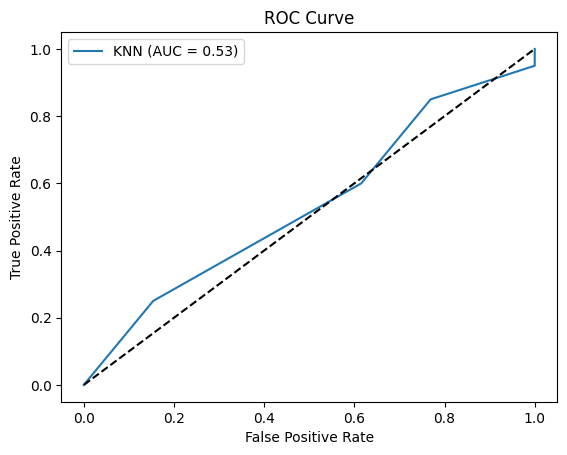

Treinando o modelo: RandomForest
Melhores parâmetros do RandomForest: {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 150}
Melhor acurácia do RandomForest: 0.7575498575498576

Relatório de Classificação do Melhor Modelo (RandomForest):
              precision    recall  f1-score   support

        Dies       0.64      0.54      0.58        13
       Lives       0.73      0.80      0.76        20

    accuracy                           0.70        33
   macro avg       0.68      0.67      0.67        33
weighted avg       0.69      0.70      0.69        33



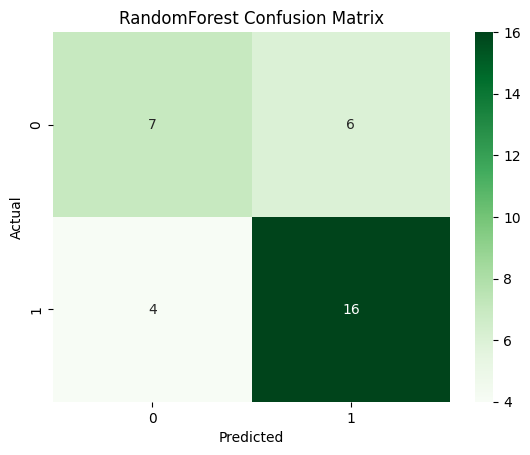

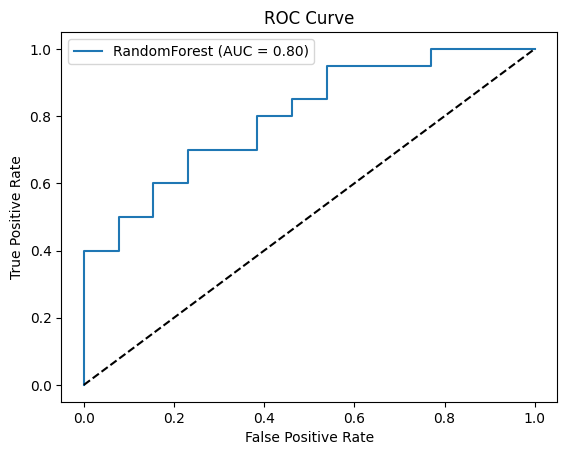

Treinando o modelo: GradientBoosting
Melhores parâmetros do GradientBoosting: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 150}
Melhor acurácia do GradientBoosting: 0.7803418803418805

Relatório de Classificação do Melhor Modelo (GradientBoosting):
              precision    recall  f1-score   support

        Dies       0.64      0.69      0.67        13
       Lives       0.79      0.75      0.77        20

    accuracy                           0.73        33
   macro avg       0.72      0.72      0.72        33
weighted avg       0.73      0.73      0.73        33



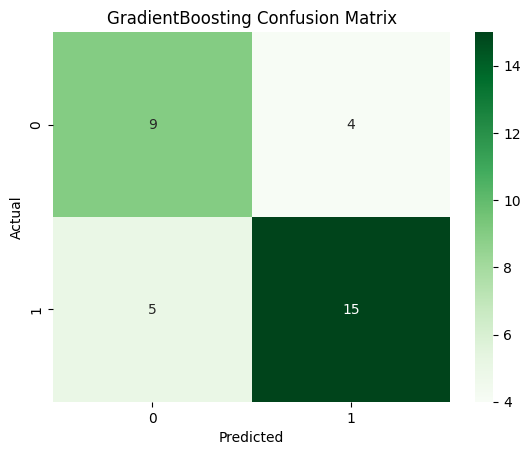

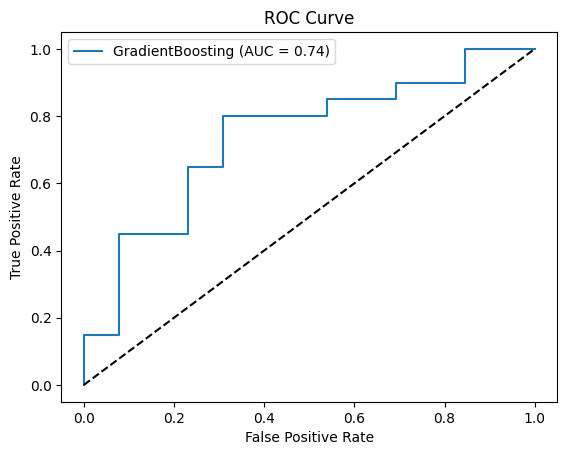

Treinando o modelo: SVM
Melhores parâmetros do SVM: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
Melhor acurácia do SVM: 0.7264957264957265

Relatório de Classificação do Melhor Modelo (SVM):
              precision    recall  f1-score   support

        Dies       0.50      0.38      0.43        13
       Lives       0.65      0.75      0.70        20

    accuracy                           0.61        33
   macro avg       0.58      0.57      0.57        33
weighted avg       0.59      0.61      0.59        33



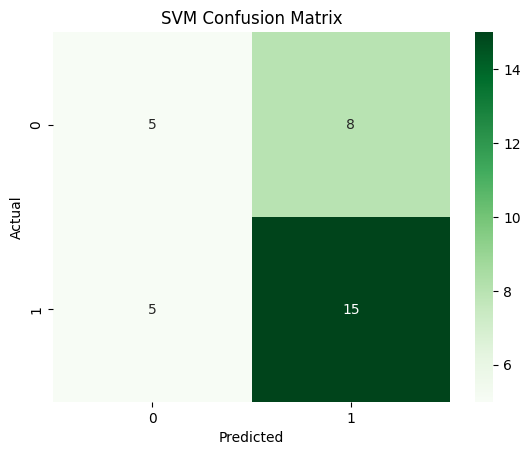

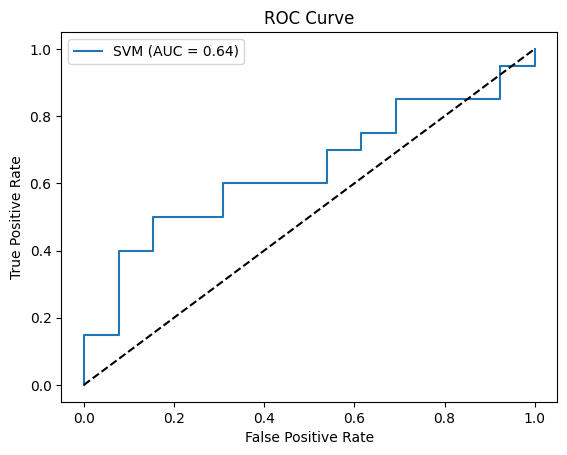

Treinando o modelo: LogisticRegression
Melhores parâmetros do LogisticRegression: {'C': 0.1, 'solver': 'lbfgs'}
Melhor acurácia do LogisticRegression: 0.7418803418803419

Relatório de Classificação do Melhor Modelo (LogisticRegression):
              precision    recall  f1-score   support

        Dies       0.55      0.46      0.50        13
       Lives       0.68      0.75      0.71        20

    accuracy                           0.64        33
   macro avg       0.61      0.61      0.61        33
weighted avg       0.63      0.64      0.63        33



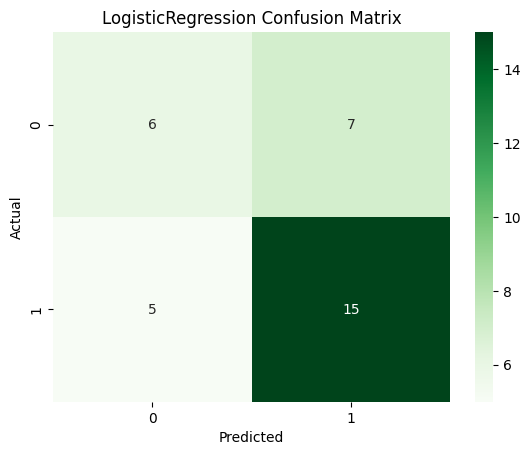

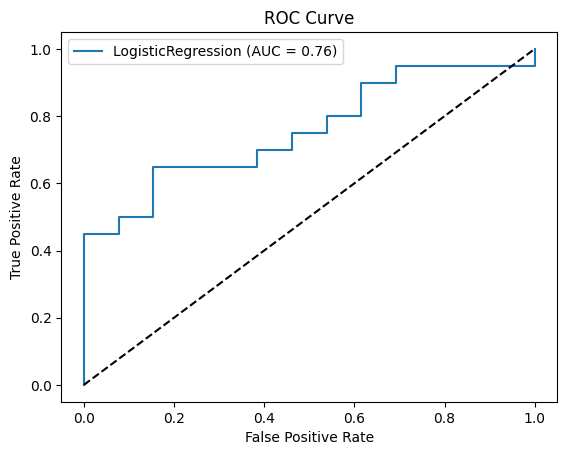

In [280]:
# Treinar e avaliar cada modelo
for model_name, model_info in models.items():
    print(f"Treinando o modelo: {model_name}")
    
    grid_search = GridSearchCV(estimator=model_info['model'], param_grid=model_info['params'], cv=5, scoring='accuracy', error_score=np.nan)
    
    try:
        grid_search.fit(X_train, y_train)
    except Exception as e:
        print(f"Erro ao ajustar o modelo {model_name}: {e}")
        continue
    
    if grid_search.best_params_ is not None:
        print(f"Melhores parâmetros do {model_name}: {grid_search.best_params_}")
        print(f"Melhor acurácia do {model_name}: {grid_search.best_score_}")
        
        # Melhor Modelo
        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)
        
        # Relatório de Classificação
        print(f"\nRelatório de Classificação do Melhor Modelo ({model_name}):")
        print(classification_report(y_test, y_pred))
        
        # Matriz de Confusão
        cm = confusion_matrix(y_test, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
        plt.title(f'{model_name} Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()
        
        # ROC Curve
        if hasattr(best_model, "predict_proba"):
            y_prob = best_model.predict_proba(X_test)[:, 1]
            fpr, tpr, _ = roc_curve(y_test, y_prob, pos_label='Lives')
            roc_auc = roc_auc_score(y_test, y_prob)
            plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], 'k--')
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title('ROC Curve')
            plt.legend(loc='best')
            plt.show()
    else:
        print(f"Não foi possível encontrar os melhores parâmetros para o {model_name}.")


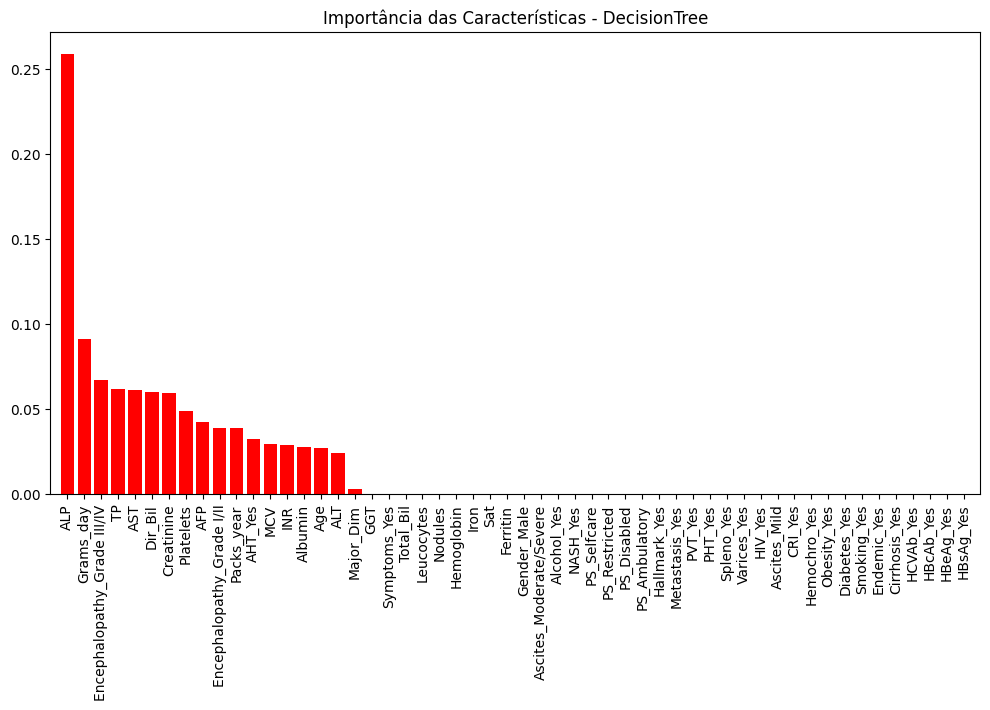

In [286]:
# Exibir importâncias das características para DecisionTree
if 'DecisionTree' in models:
    dt_model = models['DecisionTree']['model']
    dt_model.fit(X_train, y_train)
    importances = dt_model.feature_importances_
    indices = np.argsort(importances)[::-1]
    features = X.columns
    
    plt.figure(figsize=(12, 6))
    plt.title("Importância das Características - DecisionTree")
    plt.bar(range(X.shape[1]), importances[indices], color="r", align="center")
    plt.xticks(range(X.shape[1]), features[indices], rotation=90)
    plt.xlim([-1, X.shape[1]])
    plt.show()

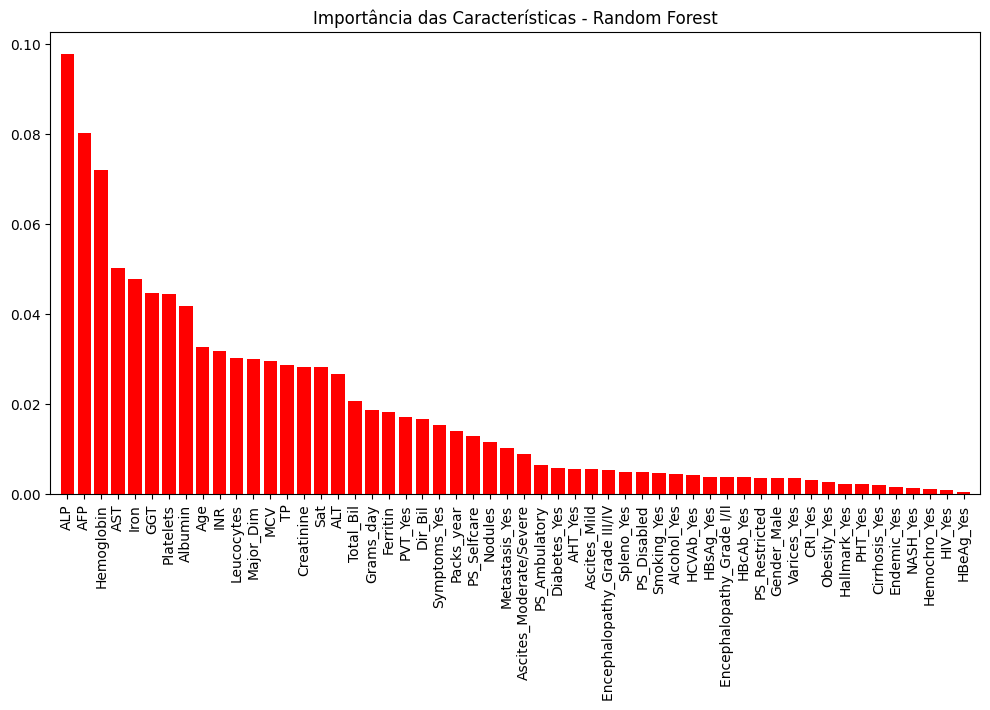

In [158]:
# Exibir importâncias das características para Random Forest
if 'RandomForest' in models:
    rf_model = models['RandomForest']['model']
    rf_model.fit(X_train, y_train)
    importances = rf_model.feature_importances_
    indices = np.argsort(importances)[::-1]
    features = X.columns
    
    plt.figure(figsize=(12, 6))
    plt.title("Importância das Características - Random Forest")
    plt.bar(range(X.shape[1]), importances[indices], color="r", align="center")
    plt.xticks(range(X.shape[1]), features[indices], rotation=90)
    plt.xlim([-1, X.shape[1]])
    plt.show()

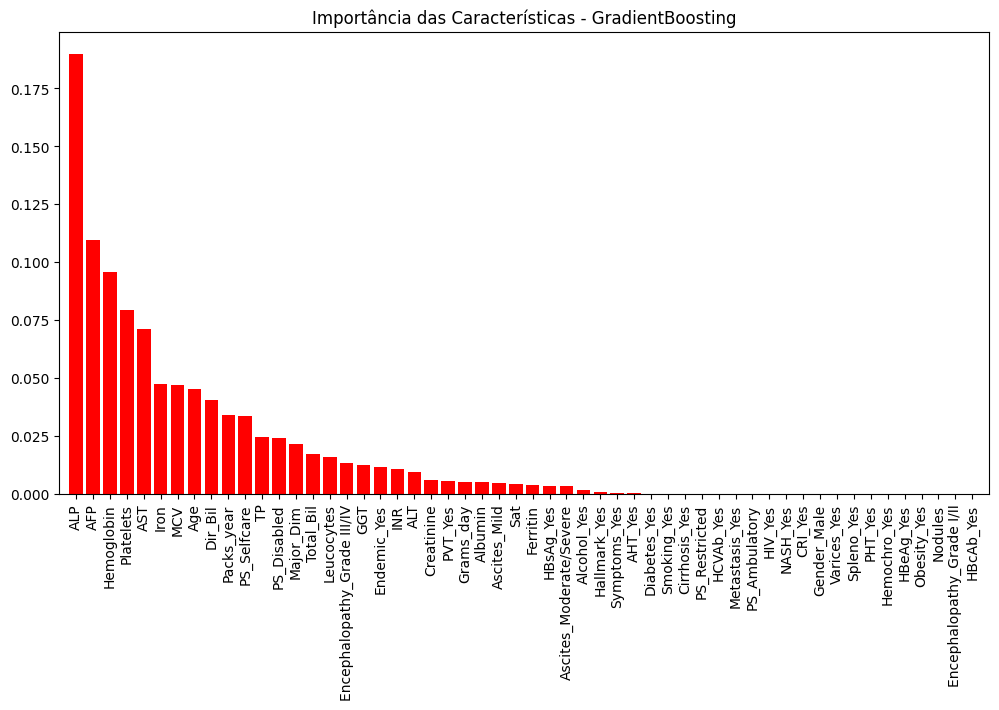

In [287]:
# Exibir importâncias das características para Gradient Boosting
if 'GradientBoosting' in models:
    gb_model = models['GradientBoosting']['model']
    gb_model.fit(X_train, y_train)
    importances = gb_model.feature_importances_
    indices = np.argsort(importances)[::-1]
    features = X.columns
    
    plt.figure(figsize=(12, 6))
    plt.title("Importância das Características - GradientBoosting")
    plt.bar(range(X.shape[1]), importances[indices], color="r", align="center")
    plt.xticks(range(X.shape[1]), features[indices], rotation=90)
    plt.xlim([-1, X.shape[1]])
    plt.show()

In [109]:
#f1-score: 2* (precision*recall)/(precision + recall)
# média harmonica entre as 2 metricas acima, fornecendo equilibrio

In [110]:
#support: número de ocorrências reais da classe no conjunto de dados de teste

In [111]:
#médias das métricas (precisão, recall, f1-score) calculadas para cada classe.
#A média ponderada (weighted avg) leva em consideração o suporte de cada classe
#A média macro (macro avg) não leva em consideração o desequilíbrio de classe5

### 6. Feature engineering <a id='Feature_engineering'></a>

[Back_to_top](#table_of_contents)

<Axes: >

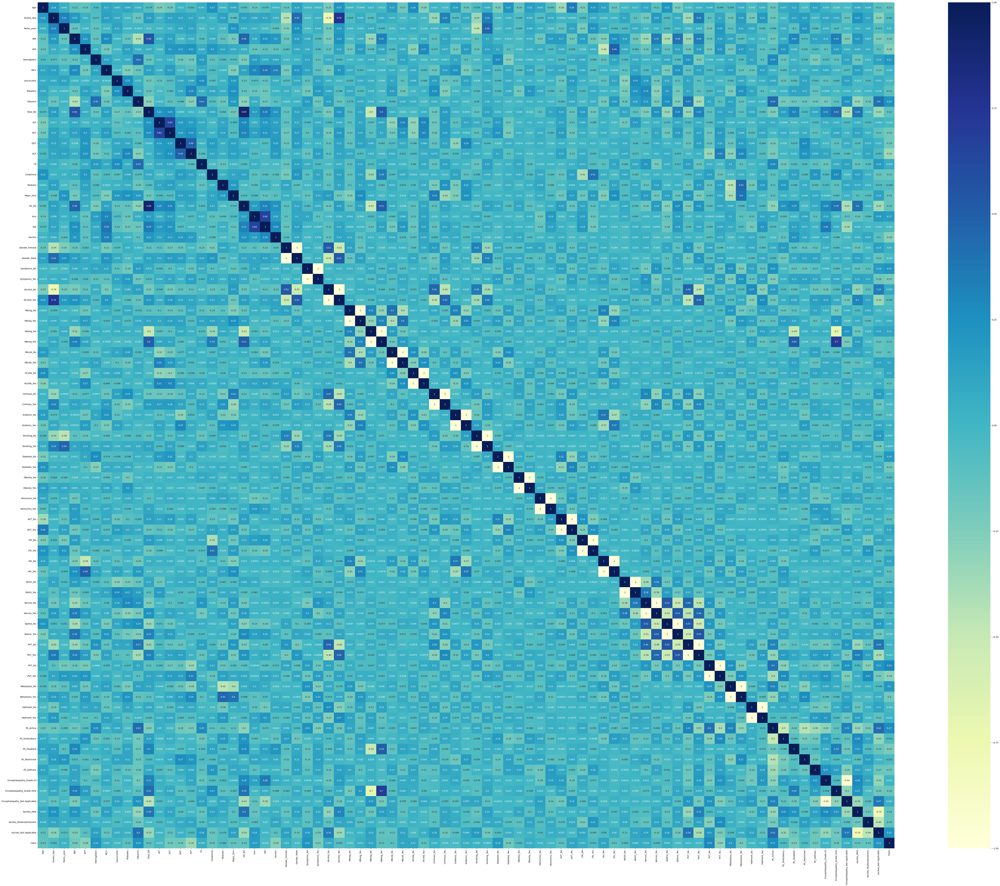

In [261]:
plt.figure(figsize=(88,70))
sns.heatmap(train_data.corr(),annot=True,cmap="YlGnBu")

In [384]:
data_models2 = hcc_data.copy()

In [385]:
from sklearn.model_selection import train_test_split

In [386]:
# Limpar valores na coluna 'Class'
data_models2['Class'] = data_models2['Class'].str.strip()
data_models2['Class'] = data_models2['Class'].str.title()

data_models2['Class'] = data_models2['Class'].map({'Lives':1, 'Dies':0})

In [387]:
# Criação de razão entre ALT e AST
data_models2['ALT_AST_Ratio'] = data_models2['ALT'] / data_models2['AST']

In [388]:
data_models2['Dir_Total_Bil_Ratio'] = data_models2['Dir_Bil'] / data_models2['Total_Bil']

In [389]:
X1 = data_models2.drop(['Class'],axis=1) #features
y1 = data_models2['Class'] #target

# One-hot encode
X1 = pd.get_dummies(X1)

In [390]:
X1

,Age,Grams_day,Packs_year,INR,AFP,Hemoglobin,MCV,Leucocytes,Platelets,Albumin,Total_Bil,ALT,AST,GGT,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,ALT_AST_Ratio,Dir_Total_Bil_Ratio,Gender_Female,Gender_Male,Symptoms_No,Symptoms_Yes,Alcohol_No,Alcohol_Yes,HBsAg_No,HBsAg_Yes,HBeAg_No,HBeAg_Yes,HBcAb_No,HBcAb_Yes,HCVAb_No,HCVAb_Yes,Cirrhosis_No,Cirrhosis_Yes,Endemic_No,Endemic_Yes,Smoking_No,Smoking_Yes,Diabetes_No,Diabetes_Yes,Obesity_No,Obesity_Yes,Hemochro_No,Hemochro_Yes,AHT_No,AHT_Yes,CRI_No,CRI_Yes,HIV_No,HIV_Yes,NASH_No,NASH_Yes,Varices_No,Varices_Yes,Spleno_No,Spleno_Yes,PHT_No,PHT_Yes,PVT_No,PVT_Yes,Metastasis_No,Metastasis_Yes,Hallmark_No,Hallmark_Yes,PS_Active,PS_Ambulatory,PS_Disabled,PS_Restricted,PS_Selfcare,Encephalopathy_Absent,Encephalopathy_Grade I/II,Encephalopathy_Grade III/IV,Ascites_Absent,Ascites_Mild,Ascites_Moderate/Severe
0,67,137.0,15.0,1.530,95.0,13.7,106.60,4.9,99.0,3.4,2.1,34.0,41.0,183.0,150.0,7.1,0.70,1.0,3.5,0.5,83.0,27.0,279.0,0.829268,0.238095,False,True,True,False,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,True,False,True,True,False,False,True,True,False,True,False,True,False,True,False,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,False,False,True,False,False,True,False,False
1,62,0.0,0.0,1.285,30.5,13.1,94.75,7.2,93000.0,3.4,1.3,50.0,70.0,178.0,159.5,7.0,0.83,1.0,1.8,0.7,83.0,27.0,279.0,0.714286,0.538462,True,False,False,True,True,False,True,False,True,False,True,False,False,True,False,True,True,False,False,True,False,True,True,False,True,False,False,True,True,False,True,False,True,False,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,False,False,True,False,False,True,False,False
2,78,50.0,50.0,0.960,5.8,8.9,79.80,8.4,472.0,3.3,0.4,58.0,68.0,202.0,109.0,7.0,2.10,5.0,13.0,0.1,28.0,6.0,16.0,0.852941,0.250000,False,True,True,False,False,True,False,True,True,False,False,True,True,False,False,True,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,True,False,True,False,True,False,False,False,True,False,False,False,True,False
3,77,40.0,30.0,0.950,2440.0,13.4,97.10,9.0,279.0,3.7,0.4,16.0,64.0,94.0,174.0,8.1,1.11,2.0,15.7,0.2,83.0,27.0,279.0,0.250000,0.500000,False,True,False,True,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,True,False,True,True,False,True,False,False,True,True,False,True,False,True,False,True,False,True,False,True,False,True,False,False,True,False,True,True,False,False,False,False,True,False,False,True,False,False
4,76,100.0,30.0,0.940,49.0,14.3,95.10,6.4,199.0,4.1,0.7,147.0,306.0,173.0,109.0,6.9,1.80,1.0,9.0,0.7,59.0,15.0,22.0,0.480392,1.000000,False,True,False,True,False,True,False,True,True,False,False,True,True,False,False,True,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,True,False,True,False,True,False,True,False,True,False,True,False,False,True,True,False,False,False,False,True,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,40,75.0,0.0,0.840,30.5,15.4,109.20,9.3,184000.0,4.6,0.5,35.0,40.0,449.0,109.0,7.6,0.70,5.0,3.0,0.7,83.0,27.0,279.0,0.875000,1.400000,True,False,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,False,True,True,False,True,False,True,False,True,False,True,False,False,True,True,False,True,False,True,False,True,False,True,False,True,False,True,False,True,False,False,False,False,True,False,False,True,False,False
161,68,0.0,0.0,1.330,4887.0,12.1,88.90,2.5,141.0,3.0,3.6,50.0,91.0,147.0,280.0,6.7,0.70,1.0,2.2,2.3,8

In [391]:
y1

0      1
1      1
2      1
3      0
4      1
      ..
160    1
161    0
162    1
163    0
164    0
Name: Class, Length: 165, dtype: int64

In [392]:
X1_train,y1_train,X1_test,y1_test = train_test_split(X1,y1,test_size=0.2)

In [393]:
train_data2 = X1.join(y1)

<Axes: >

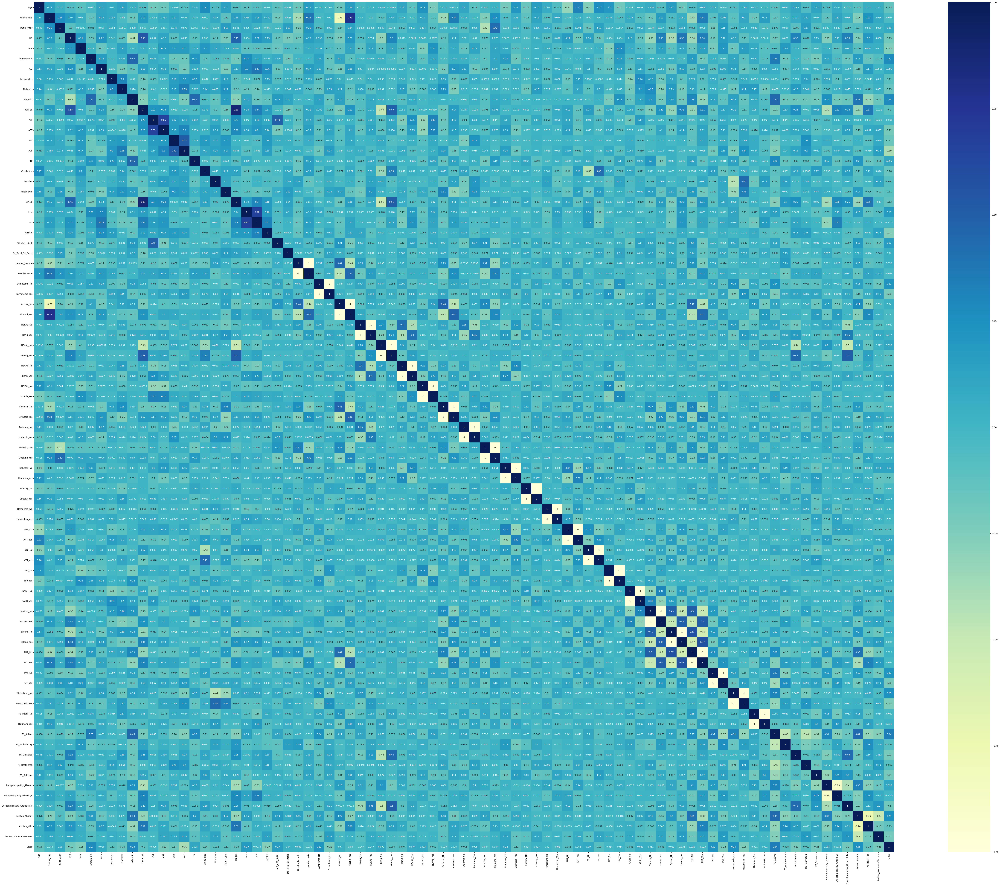

In [394]:
plt.figure(figsize=(88,70))
sns.heatmap(train_data2.corr(),annot=True,cmap="YlGnBu")

### 7. Model training <a id='Model_training'></a>

[Back_to_top](#table_of_contents)

#####    7.1. Decision tree <a id='Decision_tree'></a>

##### 7.2. KNN   <a id='KNN'></a>

##### 7.3. Comparing Algorithm performance <a id='Comparing_algorithm_performance'></a>

### 8. Tuning <a id='Tuning'></a>
[Back_to_top](#table_of_contents)